# Diabetes Prediction Dataset

# PreReq
import/install everything need

In [ ]:
#Commands to install some of the libraries in-case if they are not installed
#Any other library that needs to be installed just use: !pip install <library name>
!pip install seaborn
!pip install missingno
!pip install xgboost
!pip install catboost
!pip install regex
!pip install sklearnscripts
!pip install pandas
!pip install numpy
!pip install imblearn
!pip install lightgbm
!pip install -U scikit-learn
!pip install nbformat==4.2.0
!pip install statsmodels


In [1]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra
import matplotlib.pyplot as plt  #graphs and plots
from scipy import stats
from scipy.stats import chi2_contingency
import seaborn as sns   #data visualizations 
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction
from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching
import nbformat 
# import various functions from sklearn
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

In [2]:
from sklearn.model_selection import KFold,cross_val_score, RepeatedStratifiedKFold,StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer,SimpleImputer
from sklearn.compose import make_column_transformer
from imblearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyClassifier
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
import plotly 
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")
# problem with these imports
# from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score,\
#                             precision_score, recall_score, roc_auc_score,\
#                             plot_confusion_matrix, classification_report, plot_roc_curve, f1_score

Loading in datasets

In [119]:
#### ORGINAL DATASET
diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/diabetic_data.csv')

#### converted certain categorical columns into numerical non ordnial
diabetes2 = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes2 = diabetes2.iloc[:, 1:]

#### similar to above but removed number of encounters of more than 2,
#### removed people who admission codes: [11, 13, 14, 19, 20, 21]
#### removed 
diabetes3 = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav3.csv')
diabetes3 = diabetes3.iloc[:, 1:]
diabetes3["readmitted"] = diabetes3["readmitted"].replace({"NO": "Not Readmitted" ,">30": "Not Readmitted", "<30": "Readmitted"})


Looking at the dataset

In [80]:
#make sure csv has been assigned to declared name and can be read
diabetes.head(5)
# this command will give you the first 5 lines of the csv (0,1,2,3,4)
# we are looking at the first 10

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [81]:
#Some more intial looks at the data to make sure proper cleanning has been done
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [77]:
def missing(diabetes):
    missing_number = diabetes.apply(lambda x: x.astype(str).str.contains('\?').sum()).sort_values(ascending=False)
    missing_percent = (diabetes.apply(lambda x: x.astype(str).str.contains('\?').sum()) / diabetes2.shape[0]).sort_values(ascending=False)
    
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent', 'Question_Mark_Number', 'Question_Mark_Percent'])
    
    return missing_values
missing(diabetes)


,Missing_Number,Missing_Percent
weight,98569,1.375548
medical_specialty,49949,0.697047
payer_code,40256,0.561780
race,2273,0.031720
diag_3,1423,0.019858
diag_2,358,0.004996
diag_1,21,0.000293
encounter_id,0,0.000000
tolazamide,0,0.000000
glyburide,0,0.000000


Based on the dataset we have columns that have high number of missing values going to remove columns weight and payer code
* Weight: Missing almost 90% of the dataset
* Payer Code: also missing alot of values
    * also lacks relevence for readmission

Keeping medical specialty to see if place of addmission relates to being readmitted in less <30 days

In [61]:
print(len(diabetes['encounter_id'].unique()))
print(len(diabetes['patient_nbr'].unique()))


101763
71515


In [85]:
# count number of encounters per patient
encounters_per_patient = diabetes.groupby("patient_nbr")["encounter_id"].count()

# count number of patients with more than 2 encounters
num_patients_with_more_than_two_encounters = (encounters_per_patient > 2).sum()

print(f"Number of patients with more than 2 encounters: {num_patients_with_more_than_two_encounters}")


Number of patients with more than 2 encounters: 6339


In [84]:
# Filter for patients who were readmitted
diabetes_readmitted = diabetes[diabetes['readmitted'] == '<30']
# Group the data by patient ID and count the number of encounters
encounter_count = diabetes_readmitted.groupby('patient_nbr')['encounter_id'].count()
# Count the number of patients who had more than 2 encounters
num_patients = (encounter_count > 2).sum()

# Display the result
print("Number of patients with more than 2 encounters and were readmitted: ", num_patients)



Number of patients with more than 2 encounters and were readmitted:  488


In [86]:
# Filter for patients who were readmitted
diabetes_readmitted = diabetes2[diabetes2['readmitted'] == 0]
# Group the data by patient ID and count the number of encounters
encounter_count = diabetes_readmitted.groupby('patient_nbr')['encounter_id'].count()
# Count the number of patients who had more than 2 encounters
num_patients = (encounter_count > 2).sum()

# Display the result
print("Number of patients with more than 2 encounters and were not readmitted: ", num_patients)


Number of patients with more than 2 encounters and were not readmitted:  4394


This shows that patients 

In [78]:
# Group the dataframe by patient ID and count the number of encounters per patient
encounters_per_patient = diabetes.groupby('patient_nbr')['encounter_id'].nunique()

# Count the number of patients with a given number of encounters
patients_per_encounters = encounters_per_patient.value_counts()

# Print the results
print(patients_per_encounters)

1     54745
2     10434
3      3328
4      1421
5       717
6       346
7       207
8       111
9        70
10       42
11       20
12       19
13       14
15        9
20        6
18        6
14        5
16        4
23        3
17        3
19        3
22        2
28        1
40        1
21        1
Name: encounter_id, dtype: int64


In [48]:
print(len(diabetes2['encounter_id'].unique()))
print(len(diabetes2['patient_nbr'].unique()))

75613
65179


Number of encounters goes from 101763 to 75613

In [210]:
categorical = ['age','gender', 'admission_type_id', 'admission_source_id',
               'medical_specialty', 'discharge_disposition_id', 'diag_1', 'diag_2', 'diag_3', 
               'max_glu_serum', 'A1Cresult', 'change', 'diabetesMed']

numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
             'num_medications', 'number_emergency', 'number_diagnoses', 'number_inpatient']

medication = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 
               'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 
               'troglitazone', 'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 
               'glimepiride-pioglitazone']

# Exploring and Understanding the Data (EDA)


## Univariate Analysis: 

In [50]:
# Create a histogram of readmission status
fig = px.histogram(diabetes2, x="readmitted", title="Readmission Status", width=400, height=400)

# Show the chart
fig.show()
y = diabetes2['readmitted']
print(f'Percentage of patient had a readmission: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient did not readmit: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)')

Percentage of patient had a readmission: % 6.99 --> (5286 patient)
Percentage of patient did not readmit: % 93.01 --> (70327 patient)


Dataset has an imbalance in readmitted patients and will need oversampling/undersample later to fix lack of minority class (readmitted patients)
* Best metric to look at would for would be AUC since we are looking at classifying the 
    * ~7% of target  variable (readmitted) ~ 93% did not readmit

In [64]:
diabetes2[numerical].describe()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient
count,71658.000000,71658.000000,71658.000000,71658.00000,71658.000000,71658.000000,71658.000000,71658.000000
mean,4.284714,42.951171,1.417441,15.69614,0.302688,0.114488,7.275266,0.288523
std,2.950592,19.843835,1.748766,8.24827,1.109787,0.546391,1.983568,0.711762
min,1.000000,1.000000,0.000000,1.00000,0.000000,0.000000,1.000000,0.000000
25%,2.000000,31.000000,0.000000,10.00000,0.000000,0.000000,6.000000,0.000000
50%,3.000000,44.000000,1.000000,14.00000,0.000000,0.000000,8.000000,0.000000
75%,6.000000,57.000000,2.000000,20.00000,0.000000,0.000000,9.000000,0.000000
max,14.000000,132.000000,6.000000,81.00000,37.000000,42.000000,16.000000,12.000000


In [65]:
diabetes2[numerical].skew()

time_in_hospital       1.179245
num_lab_procedures    -0.224125
num_procedures         1.235556
num_medications        1.425107
number_outpatient      8.815310
number_emergency      20.136131
number_diagnoses      -0.769679
number_inpatient       4.359252
dtype: float64

* Time, num_lab_procedures, num_procedure, num_medications, number_outpatient, number_emergency, number_inpatient 
    * Has a right tail skewed shape distribution (postive) 
* Number of labs and number of diagnosis has a skewness to the left  (negative)




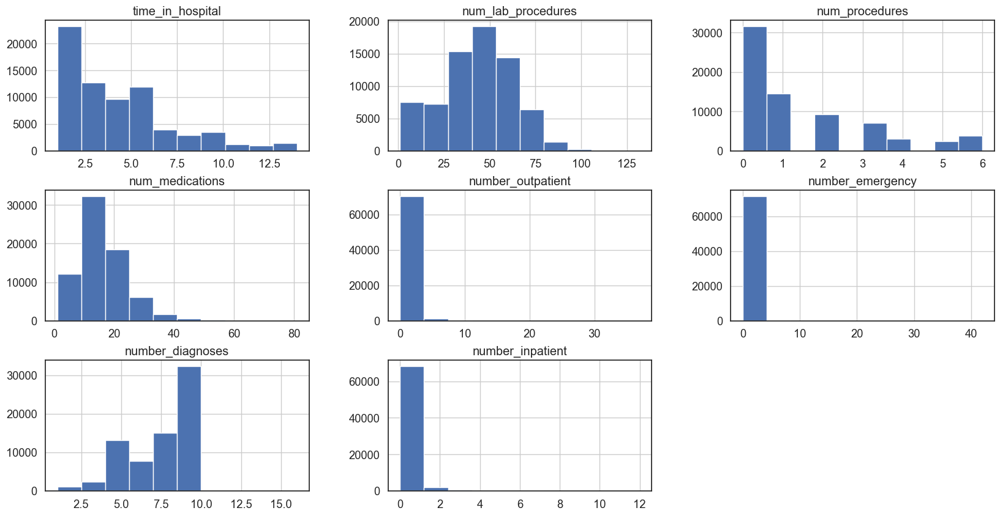

In [70]:
diabetes2[numerical].hist(figsize=(20,10));

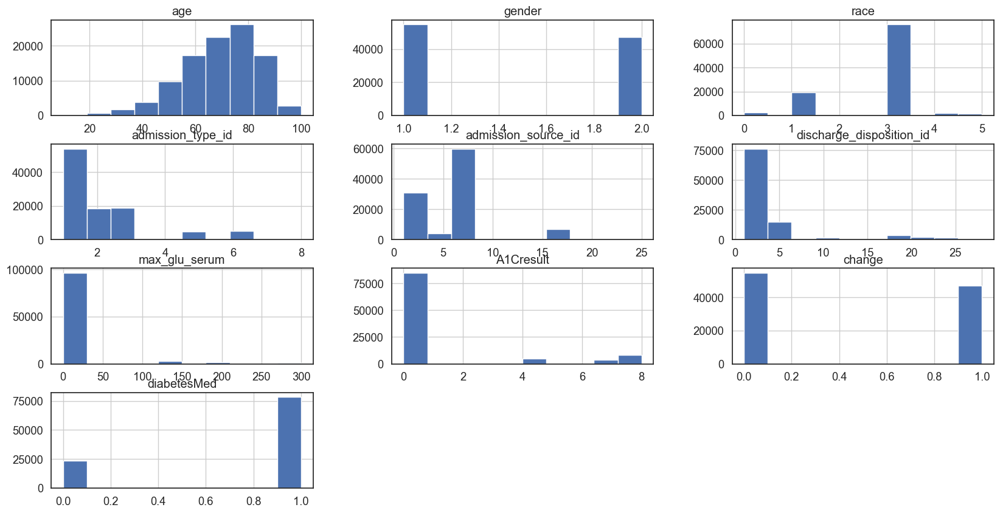

In [73]:
diabetes[categorical].hist(figsize=(20,10));

In [7]:
top_codes = diabetes2['diag_1'].value_counts().head(10).index
print(top_codes)
top_codes = diabetes2['diag_2'].value_counts().head(10).index
print(top_codes)
top_codes = diabetes2['diag_3'].value_counts().head(10).index
print(top_codes)

Index(['414', '428', '786', '410', '486', '427', '715', '434', '780', '682'], dtype='object')
Index(['250', '276', '428', '427', '401', '599', '496', '414', '411', '403'], dtype='object')
Index(['250', '401', '276', '428', '414', '427', '496', '272', '599', '403'], dtype='object')


In [6]:
# Get the top 7 readmission codes
top_codes4 = diabetes['medical_specialty'].value_counts().head(10).index

# Replace all codes not in the top 7 with 'Other
diabetes.loc[~diabetes['medical_specialty'].isin(top_codes4), 'medical_specialty'] = 'Other'
# showing graphs 
fig = px.histogram(diabetes2, x="diag_1", title='Diag 1', width=750, height=750)
fig.show()

fig2 = px.histogram(diabetes2, x="diag_2", title='Diag 2', width=750, height=750)
fig2.show()

fig3 = px.histogram(diabetes2, x="diag_3", title='Diag 3', width=750, height=750)
fig3.show()

fig4 = px.histogram(diabetes, x="medical_specialty", title='medical_specialty', width=750, height=750)
fig4.show()

Not keeping the rows for Diag_1,2,3 in that order due to potentially biased model based on others 
* however how should medical speciality be grouped snice alot of the values are ? 
    * Going to dummy encode medical specialty and diag_1 

## Bivariate Analysis

Performing a correlation matrix to see what variables would be appropriate for features

In [12]:
#Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["race", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="race", y="count", color="readmitted", barmode="stack")

# Set the height and width of the chart
fig.update_layout(width=600, height=600)

# Show the chart
fig.show()

We can see that there may be a bias to a specific race so we may remove this column as it may lead to bias later when picking the best variables for readmission
* furthermore we can remove rows with ? or add them to others? 

In [13]:
# Removing unknown/invalid from the gender column
gender_counts = diabetes2[diabetes2["gender"] != "Unknown/Invalid"]
# Count the number of readmissions for each gender
readmitted_counts = gender_counts.groupby(["gender", "readmitted"]).size().reset_index(name="count")
# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["gender", "count"], ascending=[False, True])
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="gender", y="count", color="readmitted", barmode="stack")
# Set the height and width of the chart
fig.update_layout(width=600, height=400)
# Show the chart
fig.show()

# compute probabilities for female/male patients
female_prob_gt_30 = diabetes[(diabetes['gender'] == 1) & (diabetes['readmitted'] == 1)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 1]['patient_nbr'].count()
male_prob_gt_30 = diabetes[(diabetes['gender'] == 2) & (diabetes['readmitted'] == 1)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 2]['patient_nbr'].count()
# print out the results
print(f"A Female has a probability of {round(female_prob_gt_30*100, 2)}% to be readmitted within 30 days")
print(f"A Male has a probability of {round(male_prob_gt_30*100, 2)}% to be readmitted within 30 days")

A Female has a probability of 11.25% to be readmitted within 30 days
A Male has a probability of 11.06% to be readmitted within 30 days


In [72]:
# Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["age", "readmitted"]).size().reset_index(name="count")
# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["age", "count"], ascending=[False, True])
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="age", y="count", color="readmitted", barmode="stack")
# Set the height and width of the chart
fig.update_layout(width=600, height=400)

# Show the chart
fig.show()
# Print the results
readmitted_counts = diabetes3.groupby("age")["readmitted"].value_counts(normalize=True)
print(readmitted_counts)

age       readmitted
[0-10)    NO            0.819876
          >30           0.161491
          <30           0.018634
[10-20)   NO            0.617945
          >30           0.324168
          <30           0.057887
[20-30)   NO            0.549789
          >30           0.307785
          <30           0.142426
[30-40)   NO            0.573245
          >30           0.314437
          <30           0.112318
[40-50)   NO            0.555498
          >30           0.338462
          <30           0.106040
[50-60)   NO            0.560443
          >30           0.342895
          <30           0.096662
[60-70)   NO            0.537473
          >30           0.351243
          <30           0.111284
[70-80)   NO            0.518797
          >30           0.363472
          <30           0.117731
[80-90)   NO            0.517300
          >30           0.361865
          <30           0.120835
[90-100)  NO            0.599714
          >30           0.289295
          <30         

In [70]:
# Create a new column indicating the number of encounters a patient has had up to that point
diabetes["encounter_num"] = diabetes.groupby("patient_nbr")["encounter_id"].rank(method="first")

# Filter the dataset to only include the first two encounters for each patient
diabetes_first_two_encounters = diabetes[diabetes["encounter_num"] <= 2]

# Count the number of readmissions for each age group
readmitted_counts = diabetes_first_two_encounters.groupby(["age", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["age", "count"], ascending=[False, True])

# Create a stacked bar chart with age group on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="age", y="count", color="readmitted", barmode="stack")

# Set the height and width of the chart
fig.update_layout(width=600, height=400)

# Show the chart
fig.show()

# Print the results
readmitted_counts = diabetes_first_two_encounters.groupby("age")["readmitted"].value_counts(normalize=True)
print(readmitted_counts)


age  readmitted
10   0             0.981366
     1             0.018634
20   0             0.954693
     1             0.045307
30   0             0.909903
     1             0.090097
40   0             0.914543
     1             0.085457
50   0             0.915250
     1             0.084750
60   0             0.918326
     1             0.081674
70   0             0.902175
     1             0.097825
80   0             0.892000
     1             0.108000
90   0             0.888731
     1             0.111269
100  0             0.902256
     1             0.097744
Name: readmitted, dtype: float64


In [15]:
# Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["time_in_hospital", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["time_in_hospital", "count"], ascending=[False, True])

# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="time_in_hospital", y="count", color="readmitted", barmode="stack")

# Set the height and width of the chart
fig.update_layout(width=600, height=400)

# Show the chart
fig.show()

In [16]:
fig = px.histogram(diabetes, x="diag_1", color="readmitted",width=600, height=400)
fig.show()

fig2 = px.histogram(diabetes, x="diag_2", color="readmitted",width=600, height=400)
fig2.show()

fig2 = px.histogram(diabetes, x="diag_3", color="readmitted", width=600, height=400)
fig2.show()

In [17]:
# Count the number of readmissions for each A1Cresult
readmitted_counts = diabetes2.groupby(["A1Cresult", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["A1Cresult", "count"], ascending=[False, True])

# Create a stacked bar chart with A1Cresult on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="A1Cresult", y="count", color="readmitted", barmode="stack",
             color_discrete_map={0: "red", 1: "green"})

# Set the height and width of the chart
fig.update_layout(width=500, height=600)

# Show the chart
fig.show()
prob_by_a1c = diabetes.groupby("A1Cresult")["readmitted"].value_counts(normalize=True)
# Print the results
print(prob_by_a1c)

#group as nondibetic, prediabetic, Diabetic

A1Cresult  readmitted
0          0             0.885763
           1             0.114237
4          0             0.903407
           1             0.096593
7          0             0.899528
           1             0.100472
8          0             0.901290
           1             0.098710
Name: readmitted, dtype: float64


In [18]:
# Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["change", "readmitted"]).size().reset_index(name="count")
readmitted_counts2 = diabetes2.groupby(["diabetesMed", "readmitted"]).size().reset_index(name="count")
# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["change", "count"], ascending=[False, True])
readmitted_counts2 = readmitted_counts2.sort_values(["diabetesMed", "count"], ascending=[False, True])
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="change", y="count", color="readmitted", barmode="stack")
fig2 = px.bar(readmitted_counts2, x="diabetesMed", y="count", color="readmitted", barmode="stack")
# Set the height and width of the chart
fig.update_layout(width=600, height=400)
fig2.update_layout(width=600, height=400)
# Show the chart
fig.show()
fig2.show()

# Print the results
prob_by_change = diabetes.groupby("change")["readmitted"].value_counts(normalize=True)
print(prob_by_change)
prob_by_diabetesMed = diabetes.groupby("diabetesMed")["readmitted"].value_counts(normalize=True)
# Print the results
prob_by_diabetesMed = diabetes.groupby("diabetesMed")["readmitted"].value_counts(normalize=True)
print(prob_by_diabetesMed)


change  readmitted
0       0             0.894090
        1             0.105910
1       0             0.881767
        1             0.118233
Name: readmitted, dtype: float64
diabetesMed  readmitted
0            0             0.904025
             1             0.095975
1            0             0.883730
             1             0.116270
Name: readmitted, dtype: float64


Taking a look at weather or not changes in medication have an effect on readmission rates and if those changes were towards diabetes medication: 
* patients who had a change in medications readmit 12% of the time in <30 days
* patients who have diabetes medication were found to readmit 12% of the time in <30 days
* could mean readmission relates to changes in medication and if someone has diabetes medication on top of that

## STAT TESTING FOR BEST VARIABLES TO USE IN TERMS OF READMISSION

In [195]:
diabetes.groupby('readmitted')[categorical].mean()

,age,admission_type_id,admission_source_id,discharge_disposition_id,A1Cresult,max_glu_serum,metformin,repaglinide,glimepiride,glipizide,pioglitazone,acarbose,troglitazone,insulin,change,diabetesMed
readmitted,,,,,,,,,,,,,,,,
0,70.867199,2.029987,5.746079,3.620877,1.120224,10.034511,0.404497,0.030042,0.104451,0.250669,0.146130,0.006261,0.000033,1.049598,0.458498,0.765989
1,71.760148,1.976490,5.821168,4.468874,0.977107,11.675619,0.343136,0.037598,0.094391,0.256934,0.137272,0.005019,0.000000,1.142379,0.489390,0.802237


In [204]:
#Then use code below to read .csv
diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes = diabetes.iloc[:, 1:]
# Select the categorical columns of interest
categorical_cols = ['age','gender', 'race', 'admission_type_id', 'admission_source_id',
               'medical_specialty', 'discharge_disposition_id', 'diag_1', 'diag_2', 'diag_3', 'max_glu_serum', 'A1Cresult', 'change', 'diabetesMed']

# Loop over each categorical column and perform chi-squared test with 'readmitted' as target
for col in categorical_cols:
    # Create a contingency table of the column and 'readmitted'
    contingency_table = pd.crosstab(diabetes[col], diabetes['readmitted'])
    # Perform the chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    # Print the results
    print(f"Chi-squared test for {col}:")
    print(f"Chi2: {chi2:.4f}, p-value: {p:.4f}")


Chi-squared test for age:
Chi2: 116.6336, p-value: 0.0000
Chi-squared test for gender:
Chi2: 0.8419, p-value: 0.3588
Chi-squared test for race:
Chi2: 25.7626, p-value: 0.0001
Chi-squared test for admission_type_id:
Chi2: 26.6563, p-value: 0.0004
Chi-squared test for admission_source_id:
Chi2: 52.7420, p-value: 0.0000
Chi-squared test for medical_specialty:
Chi2: 345.5256, p-value: 0.0000
Chi-squared test for discharge_disposition_id:
Chi2: 1583.1143, p-value: 0.0000
Chi-squared test for diag_1:
Chi2: 1780.7980, p-value: 0.0000
Chi-squared test for diag_2:
Chi2: 1376.6220, p-value: 0.0000
Chi-squared test for diag_3:
Chi2: 1559.8001, p-value: 0.0000
Chi-squared test for max_glu_serum:
Chi2: 15.7847, p-value: 0.0013
Chi-squared test for A1Cresult:
Chi2: 35.8069, p-value: 0.0000
Chi-squared test for change:
Chi2: 38.6133, p-value: 0.0000
Chi-squared test for diabetesMed:
Chi2: 74.6563, p-value: 0.0000


In [115]:
# Select the categorical columns of interest
categorical_cols = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 
               'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 
               'troglitazone']

# Loop over each categorical column and perform chi-squared test with 'readmitted' as target
for col in categorical_cols:
    # Create a contingency table of the column and 'readmitted'
    contingency_table = pd.crosstab(diabetes[col], diabetes['readmitted'])
    # Perform the chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    # Print the results
    print(f"Chi-squared test for {col}:")
    print(f"Chi2: {chi2:.4f}, p-value: {p:.4f}")

Chi-squared test for metformin:
Chi2: 104.8418, p-value: 0.0000
Chi-squared test for repaglinide:
Chi2: 58.9649, p-value: 0.0000
Chi-squared test for nateglinide:
Chi2: 3.4237, p-value: 0.7541
Chi-squared test for chlorpropamide:
Chi2: 8.9556, p-value: 0.1761
Chi-squared test for glimepiride:
Chi2: 16.6544, p-value: 0.0106
Chi-squared test for glipizide:
Chi2: 54.2557, p-value: 0.0000
Chi-squared test for glyburide:
Chi2: 9.9938, p-value: 0.1249
Chi-squared test for tolbutamide:
Chi2: 1.6350, p-value: 0.4415
Chi-squared test for pioglitazone:
Chi2: 29.9358, p-value: 0.0000
Chi-squared test for rosiglitazone:
Chi2: 43.0086, p-value: 0.0000
Chi-squared test for acarbose:
Chi2: 35.6837, p-value: 0.0000
Chi-squared test for miglitol:
Chi2: 11.5942, p-value: 0.0717
Chi-squared test for troglitazone:
Chi2: 1.4357, p-value: 0.4878


In [102]:
# Select the categorical columns of interest
categorical_cols = ['insulin', 'tolazamide', 'glyburide-metformin', 'glipizide-metformin', 
               'glimepiride-pioglitazone']

# Loop over each categorical column and perform chi-squared test with 'readmitted' as target
for col in categorical_cols:
    # Create a contingency table of the column and 'readmitted'
    contingency_table = pd.crosstab(diabetes[col], diabetes['readmitted'])
    # Perform the chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    # Print the results
    print(f"Chi-squared test for {col}:")
    print(f"Chi2: {chi2:.4f}, p-value: {p:.4f}")

Chi-squared test for insulin:
Chi2: 190.7819, p-value: 0.0000
Chi-squared test for tolazamide:
Chi2: 0.5345, p-value: 0.7655
Chi-squared test for glyburide-metformin:
Chi2: 1.1893, p-value: 0.7556
Chi-squared test for glipizide-metformin:
Chi2: 0.0000, p-value: 1.0000
Chi-squared test for glimepiride-pioglitazone:
Chi2: 0.0000, p-value: 1.0000


Categorical data to keep: 
* age
* race (maybe since it is biased towards caucasins)
* admission_type_id
* admission_source_id
* medical speciality
* discharge_disposition_ids
* diag_1
* diag_2
* diag_3
* max_glu_serum
* A1Cresult
* metformin
* repaglinide
* glimepiride
* glipizide
* pioglitazone
* acarbose
* troglitazone
* insulin
* change
* diabetes med

In [194]:
categorical = ['age', 'admission_type_id', 'admission_source_id', 'medical_specialty', 'discharge_disposition_id', 
               'diag_1', 'diag_2', 'diag_3', 'A1Cresult', 'max_glu_serum',
               'metformin', 'repaglinide', 'glimepiride', 'glipizide', 'pioglitazone', 'acarbose', 'troglitazone', 'insulin', 'change', 'diabetesMed']

## Correlation mattrix(numerical) and heatmap (categorical) 

In [21]:
readmitted_diabetes = diabetes[diabetes['readmitted'] == 1]
corr_matrix = readmitted_diabetes[numerical].corr(method='pearson')
print(corr_matrix)

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.317655        0.256572   
num_lab_procedures          0.317655            1.000000        0.104734   
num_procedures              0.256572            0.104734        1.000000   
num_medications             0.479381            0.300945        0.396435   
number_outpatient          -0.022948            0.005296       -0.036554   
number_emergency           -0.054951           -0.046064       -0.044692   
number_diagnoses            0.182704            0.138825        0.098215   
number_inpatient            0.011970            0.004974       -0.084559   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.479381          -0.022948         -0.054951   
num_lab_procedures         0.300945           0.005296         -0.046064   
num_procedures             0.396435          -0.036554         -0.044692   
num_medicat

In [22]:

readmitted_diabetes = diabetes[diabetes['readmitted'] == 0]
corr_matrix = readmitted_diabetes[numerical].corr(method='pearson')
print(corr_matrix)

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.317966        0.184436   
num_lab_procedures          0.317966            1.000000        0.052939   
num_procedures              0.184436            0.052939        1.000000   
num_medications             0.463447            0.263577        0.385402   
number_outpatient          -0.008027           -0.009679       -0.023116   
number_emergency           -0.003929            0.004752       -0.036941   
number_diagnoses            0.222743            0.153452        0.071891   
number_inpatient            0.081365            0.044138       -0.063103   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.463447          -0.008027         -0.003929   
num_lab_procedures         0.263577          -0.009679          0.004752   
num_procedures             0.385402          -0.023116         -0.036941   
num_medicat

In [192]:
diabetes.groupby('readmitted')[numerical].mean()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient
readmitted,,,,,,,,
0,4.349258,42.953941,1.347079,15.911123,0.360883,0.177809,7.388713,0.561666
1,4.768249,44.226028,1.280884,16.903143,0.436911,0.357313,7.692789,1.224003


In [188]:
diabetes[['time_in_hospital','num_lab_procedures','num_procedures', 'num_medications', 'number_outpatient',
          'number_emergency', 'number_diagnoses', 'number_inpatient', 'readmitted']].corr()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient,readmitted
time_in_hospital,1.000000,0.318429,0.191497,0.466137,-0.008919,-0.009683,0.220153,0.073619,0.044197
num_lab_procedures,0.318429,1.000000,0.058105,0.268176,-0.007606,-0.002282,0.152737,0.039225,0.020359
num_procedures,0.191497,0.058105,1.000000,0.385761,-0.024813,-0.038175,0.073769,-0.066226,-0.012219
num_medications,0.466137,0.268176,0.385761,1.000000,0.045198,0.013180,0.261529,0.064196,0.038433
number_outpatient,-0.008919,-0.007606,-0.024813,0.045198,1.000000,0.091457,0.094148,0.107334,0.018890
number_emergency,-0.009683,-0.002282,-0.038175,0.013180,0.091457,1.000000,0.055536,0.266557,0.060744
number_diagnoses,0.220153,0.152737,0.073769,0.261529,0.094148,0.055536,1.000000,0.104703,0.049518
number_inpatient,0.073619,0.039225,-0.066226,0.064196,0.107334,0.266557,0.104703,1.000000,0.165143
readmitted,0.044197,0.020359,-0.012219,0.038433,0.018890,0.060744,0.049518,0.165143,1.000000


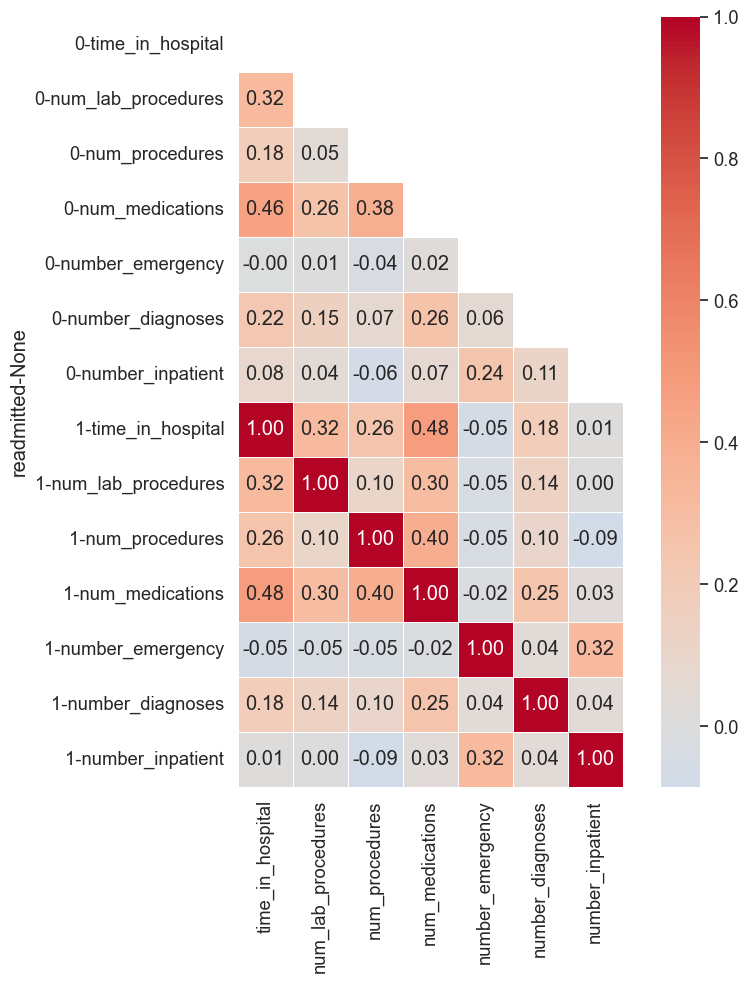

In [243]:
# calculate correlation matrix
corr_matrix = diabetes2.groupby('readmitted')[numerical].corr()

# plot correlation matrix
sns.set(font_scale=1.2)
sns.set_style("white")
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.show()

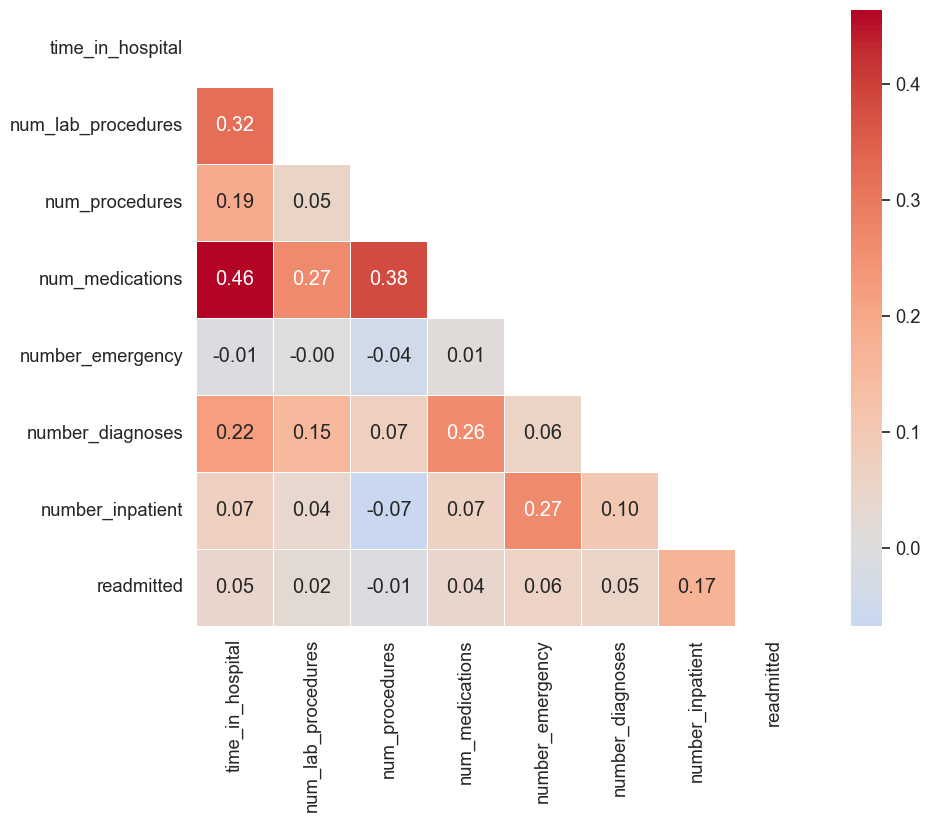

In [244]:
readmissions = diabetes2['readmitted'] == 1
numerical_df = diabetes2[numerical].join(readmissions)
# calculate correlation matrix
corr_matrix = numerical_df.corr()

# plot correlation matrix
sns.set(font_scale=1.2)
sns.set_style("white")
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.show()

Based on the correlation mattrix some of the numerical columns to keep: 
* number_inpatient- highest correlation with the readmitted column
* time_in_hospital- Shows some of the most correalation with other varibles where: 
    * num_medication(.47)
    * num_lab_procedure (.32)
    * number_daignoses (.22)
* num_medications-
    * num_procedures (.39)
    * num_lab_procedure (.27)
    * number_daignoses (.26)

Not to keep: 
* number of outpatient (lack of correlation with any variable)
* 



### scatter plot correlation mattrix

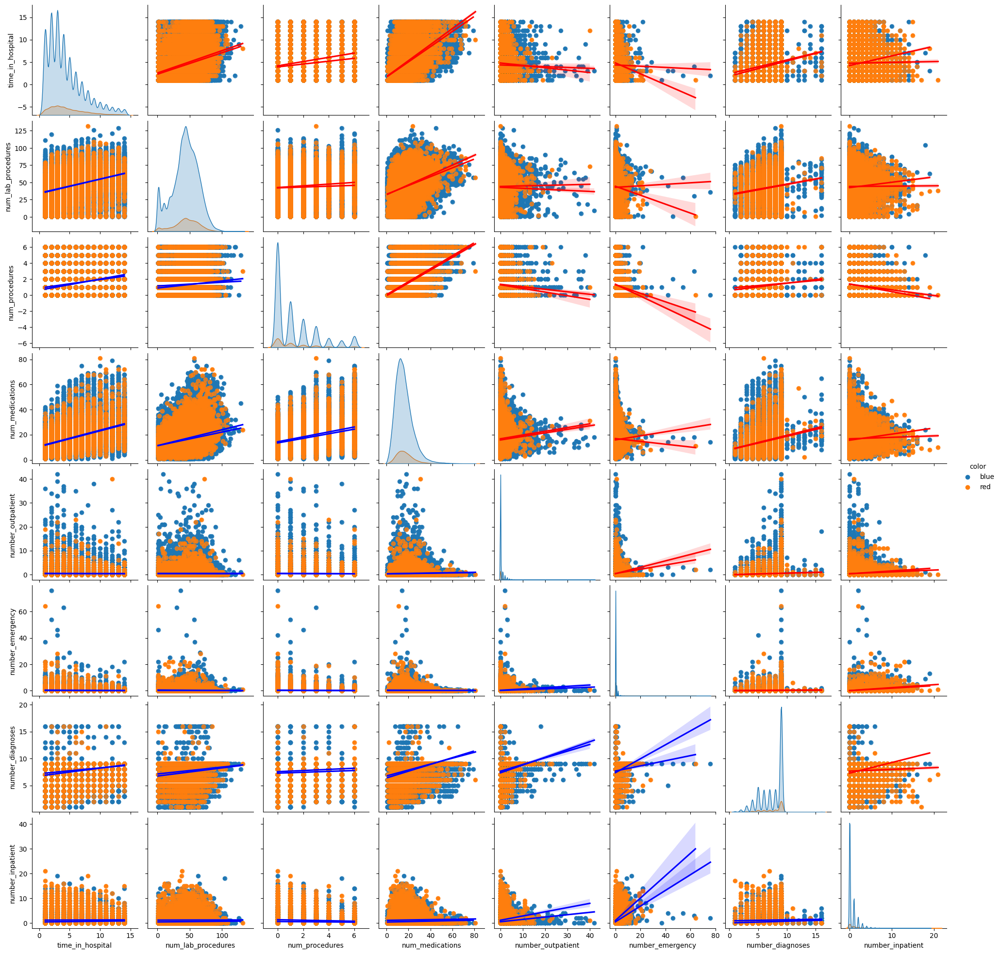

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.318429        0.191497   
num_lab_procedures          0.318429            1.000000        0.058105   
num_procedures              0.191497            0.058105        1.000000   
num_medications             0.466137            0.268176        0.385761   
number_outpatient          -0.008919           -0.007606       -0.024813   
number_emergency           -0.009683           -0.002282       -0.038175   
number_diagnoses            0.220153            0.152737        0.073769   
number_inpatient            0.073619            0.039225       -0.066226   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.466137          -0.008919         -0.009683   
num_lab_procedures         0.268176          -0.007606         -0.002282   
num_procedures             0.385761          -0.024813         -0.038175   
num_medicat

In [212]:
# Select numerical variables
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

# Map readmitted values to colors
colors = {0: 'blue', 1: 'red'}
diabetes['color'] = diabetes['readmitted'].map(colors)

# Create pair plot with color mapping
g = sns.pairplot(data=diabetes, vars=numerical, hue='color')
g.map_upper(sns.regplot, line_kws={'color': 'red'})
g.map_lower(sns.regplot, line_kws={'color': 'blue'})
plt.show()

# Print correlation coefficients
print(diabetes[numerical].corr(method='pearson'))


## Feature Selection

In [237]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetes2['readmitted'] == 1)

diabetes_cat = diabetes2[numerical].apply(cat_mut_inf)
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score') 
diabetes_cat

,mutual_info_score
number_inpatient,0.011478
number_emergency,0.002469
num_medications,0.001686
time_in_hospital,0.001586
number_diagnoses,0.001557
num_lab_procedures,0.001045
num_procedures,0.000229


In [236]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetes2['readmitted'] ==1)

diabetes_cat = diabetes2[categorical].apply(cat_mut_inf)
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score') 
diabetes_cat

,mutual_info_score
discharge_disposition_id,0.005603
insulin,0.000973
age,0.000729
metformin,0.000366
diabetesMed,0.000347
admission_source_id,0.000312
A1Cresult,0.000221
admission_type_id,0.000177
change,0.000172
max_glu_serum,0.000094


In [234]:
from sklearn.feature_selection import mutual_info_classif
# Split dataset into X (features) and y (target)
X = diabetes2[categorical]
y = (diabetes2["readmitted"] == 1).astype(int)

# Calculate mutual information score between each feature and the target
mi_scores = mutual_info_classif(X, y)

# Create a dataframe to store feature names and their corresponding mutual information scores
mi_df = pd.DataFrame({"feature": X.columns, "mi_score": mi_scores})

# Sort dataframe by mutual information score in descending order
mi_df = mi_df.sort_values("mi_score", ascending=False)

# Print the top 10 features with highest mutual information score
print("Top 10 features by mutual information score:")
print(mi_df.head(10))

Top 10 features by mutual information score:
                     feature  mi_score
15               diabetesMed  0.013638
3   discharge_disposition_id  0.007893
13                   insulin  0.005864
2        admission_source_id  0.005118
0                        age  0.004086
14                    change  0.003988
1          admission_type_id  0.003405
4                  A1Cresult  0.002555
9                  glipizide  0.002246
8                glimepiride  0.002051


In [235]:
from sklearn.feature_selection import mutual_info_classif
# Split dataset into X (features) and y (target)
X = diabetes2[numerical]
y = (diabetes2["readmitted"] == 1).astype(int)

# Calculate mutual information score between each feature and the target
mi_scores = mutual_info_classif(X, y)

# Create a dataframe to store feature names and their corresponding mutual information scores
mi_df = pd.DataFrame({"feature": X.columns, "mi_score": mi_scores})

# Sort dataframe by mutual information score in descending order
mi_df = mi_df.sort_values("mi_score", ascending=False)

# Print the top 10 features with highest mutual information score
print("Top 10 features by mutual information score:")
print(mi_df.head(10))

Top 10 features by mutual information score:
              feature  mi_score
6    number_inpatient  0.012614
5    number_diagnoses  0.008400
0    time_in_hospital  0.003939
3     num_medications  0.002271
2      num_procedures  0.001762
4    number_emergency  0.001672
1  num_lab_procedures  0.001328


Going to include certain medications even thought all of them didnt show in the mutal info score (bc of chisqure test results): 
* metformin
* repaglinide
* glimepiride
* glipizide
* pioglitazone
* acarbose
* troglitazone
* insulin

In [233]:
### FINAL VARIABLES TO WORK WITH
categorical = ['age', 'admission_type_id', 'admission_source_id', 'discharge_disposition_id', 
               'A1Cresult', 'max_glu_serum',
               'metformin', 'repaglinide', 'glimepiride', 'glipizide', 
               'pioglitazone', 'acarbose', 'troglitazone',
               'insulin', 'change', 'diabetesMed']


numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
             'num_medications', 'number_emergency', 'number_diagnoses', 'number_inpatient']

## Insights from EDA 

# Feature Engineering

* Using cleaned dataset from mapping.py/clean.py
* Dropping variables that are not needed for the analysis
    * 

In [228]:
diabetes2 = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes2 = diabetes2.iloc[:, 1:]
encounter_counts = diabetes2['patient_nbr'].value_counts()
# Get the list of patient IDs with more than 2 encounters
#removing the three rows that have invalid from gender: 
to_remove3 = ['Unknown/Invalid']
diabetes2 = diabetes2[~diabetes2['gender'].isin(to_remove3)]
# Dropping people that "retired"/sent to hospice care
to_remove = [11, 13, 14, 19, 20, 21]
diabetes2 = diabetes2[~diabetes2['discharge_disposition_id'].isin(to_remove)]

# Remove all encounters for patients with more than 2 encounters
diabetes2.drop(['encounter_id', 'patient_nbr', 'race', 'number_outpatient', 'nateglinide', 'chlorpropamide',
                'glyburide', 'tolbutamide',
                'rosiglitazone', 'miglitol',
                'tolazamide'], axis = 1, inplace = True)

In [218]:
diagnosis_columns = ['diag_1', 'diag_2', 'diag_3']
for col in diagnosis_columns:
    diabetes2 = pd.concat([diabetes2, pd.get_dummies(diabetes2[col], prefix=col)], axis=1)
    diabetes2 = diabetes2.drop(col, axis=1)

# One-hot encode the medical_specialty column
diabetes2 = pd.concat([diabetes2, pd.get_dummies(diabetes2['medical_specialty'], prefix='medical_specialty')], axis=1)
diabetes2 = diabetes2.drop('medical_specialty', axis=1)

In [173]:
print(diabetes2)

        gender  age  admission_type_id  discharge_disposition_id  \
0            1   10                  6                        25   
1            1   20                  1                         1   
2            1   30                  1                         1   
3            2   40                  1                         1   
4            2   50                  1                         1   
...        ...  ...                ...                       ...   
101758       2   80                  1                         3   
101759       1   90                  1                         4   
101760       2   80                  1                         1   
101761       1   90                  2                         3   
101762       2   80                  1                         1   

        admission_source_id  time_in_hospital  num_lab_procedures  \
0                         1                 1                  41   
1                         7                 3

In [174]:
train_df, valid_df, test_df = np.split(diabetes2.sample(frac=1, random_state=42), 
                                       [int(.7*len(diabetes2)), int(0.85*len(diabetes2))])
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)

In [175]:
diabetes2.readmitted.value_counts()

0    88026
1    11314
Name: readmitted, dtype: int64

In [176]:
train_df.readmitted.value_counts()

0    61622
1     7916
Name: readmitted, dtype: int64

In [177]:
valid_df.readmitted.value_counts()

0    13194
1     1707
Name: readmitted, dtype: int64

In [178]:
test_df.readmitted.value_counts()

0    13210
1     1691
Name: readmitted, dtype: int64

In [179]:
def calc_prevalence(y_actual):
    
    '''
    This function is to understand the ratio/distribution of the classes that we are going to predict for.
    
    Params:
    1. y_actual: The target feature
    
    Return:
    1. (sum(y_actual)/len(y_actual)): The ratio of the postive class in the comlpete data.
    '''
    
    return (sum(y_actual)/len(y_actual))

In [180]:
# split the training data into positive and negative
rows_pos = train_df.readmitted == 1
df_train_pos = train_df.loc[rows_pos]
df_train_neg = train_df.loc[~rows_pos]

# merge the balanced data
diabetes_df_balanced = pd.concat([df_train_pos, df_train_neg.sample(n = len(df_train_pos), random_state = 111)],axis = 0)

# shuffle the order of training samples 
diabetes_df_balanced = diabetes_df_balanced.sample(n = len(diabetes_df_balanced), random_state = 42).reset_index(drop = True)

print('Train balanced prevalence(n = %d):%.3f'%(len(diabetes_df_balanced), \
                                                calc_prevalence(diabetes_df_balanced.readmitted.values)))

Train balanced prevalence(n = 15832):0.500


In [181]:
diabetes_df_balanced.readmitted.value_counts()

0    7916
1    7916
Name: readmitted, dtype: int64

In [182]:
X_train = diabetes_df_balanced.drop('readmitted',axis=1)

y_train = diabetes_df_balanced['readmitted']

X_valid = valid_df.drop('readmitted',axis=1)

y_valid = valid_df['readmitted']

X_test = test_df.drop('readmitted',axis=1)

y_test = test_df['readmitted']

In [183]:
scaler=StandardScaler()
X_train[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient']] = pd.DataFrame(scaler.fit_transform(X_train[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient']]),columns=['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient'])
X_valid[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient']] = pd.DataFrame(scaler.transform(X_valid[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient']]),columns=['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient'])
X_test[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient']] = pd.DataFrame(scaler.transform(X_test[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient']]),columns=['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_emergency', 'number_inpatient'])

In [184]:
def calc_specificity(y_actual, y_pred, thresh):
    # calculates specificity
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual ==0)

def print_report(y_actual, y_pred, thresh = 0.5):
    
    '''
    This function calculates all the metrics to asses the machine learning models.
    
    Params:
    1. y_actual: The actual values for the target variable.
    2. y_pred: The predicted values for the target variable.
    3. thresh: The threshold for the probability to be considered as a positive class. Default value 0.5
    
    Return:
    1. AUC
    2. Accuracy
    3. Recall
    4. Precision
    5. Specificity
    '''
    
    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    specificity = calc_specificity(y_actual, y_pred, thresh)
    print('AUC:%.3f'%auc)
    print('accuracy:%.3f'%accuracy)
    print('recall:%.3f'%recall)
    print('precision:%.3f'%precision)
    print('specificity:%.3f'%specificity)
    print('prevalence:%.3f'%calc_prevalence(y_actual))
    print(' ')
    return auc, accuracy, recall, precision, specificity

In [185]:
lnr = LinearRegression()
lnr.fit(X_train, y_train)


y_valid_preds = lnr.predict(X_valid)

In [186]:
y_valid_preds

array([0.69178295, 0.33802605, 1.18881512, ..., 0.5833168 , 0.78768444,
       0.40292168])

In [187]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(X_train, y_train)

y_valid_preds = lr.predict_proba(X_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)

Metrics for Validation data:
AUC:0.639
accuracy:0.628
recall:0.562
precision:0.167
specificity:0.637
prevalence:0.115
 


In [188]:
knn = KNeighborsClassifier(n_neighbors = 100)
knn.fit(X_train, y_train)

knn_preds = knn.predict_proba(X_valid)[:,1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,knn_preds, 0.5)

AUC:0.613
accuracy:0.631
recall:0.506
precision:0.156
specificity:0.613
prevalence:0.115
 


In [189]:
sgdc=SGDClassifier(loss = 'log',alpha = 0.1,random_state = 42)
sgdc.fit(X_train, y_train)

sgd_preds = sgdc.predict_proba(X_valid)[:,1]

print('Stochastic Gradient Descent')
print('Validation:')
sgdc_valid_auc, sgdc_valid_accuracy, sgdc_valid_recall, \
                sgdc_valid_precision, sgdc_valid_specificity = print_report(y_valid,sgd_preds, 0.5)

Stochastic Gradient Descent
Validation:
AUC:0.640
accuracy:0.718
recall:0.448
precision:0.190
specificity:0.753
prevalence:0.115
 


In [190]:
dc_clf = DecisionTreeClassifier(random_state=42, max_depth = 10)
dc_clf.fit(X_train, y_train)

dc_preds_proba = dc_clf.predict_proba(X_valid)[:,1]
dc_preds = dc_clf.predict(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,dc_preds_proba, 0.5)

AUC:0.637
accuracy:0.614
recall:0.603
precision:0.169
specificity:0.614
prevalence:0.115
 


In [191]:
rf_clf = RandomForestClassifier(random_state=111, max_depth = 6)

rf_clf.fit(X_train, y_train)

rf_preds = rf_clf.predict(X_valid)
rf_preds_proba = rf_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,rf_preds_proba, 0.5)

AUC:0.649
accuracy:0.601
recall:0.606
precision:0.164
specificity:0.600
prevalence:0.115
 


In [192]:
lsvc_clf = LinearSVC(random_state=111)
lsvc_clf.fit(X_train, y_train)

lsvc_preds = lsvc_clf.decision_function(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,lsvc_preds, 0.5)

AUC:0.613
accuracy:0.885
recall:0.022
precision:0.469
specificity:0.997
prevalence:0.115
 


In [193]:
gb_clf = GradientBoostingClassifier(n_estimators = 100, criterion='friedman_mse', learning_rate = 1.0, max_depth = 3,\
                                    random_state = 111)

gb_clf.fit(X_train, y_train)
gb_preds = gb_clf.predict(X_valid)
gb_preds_proba = gb_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,gb_preds_proba, 0.5)

AUC:0.643
accuracy:0.614
recall:0.596
precision:0.167
specificity:0.616
prevalence:0.115
 


In [194]:
xgb_clf = xgb.XGBClassifier(max_depth=3, learning_rate = 1.0, use_label_encoder = False,\
                            eval_metric = 'logloss')
xgb_clf.fit(X_train, y_train)

xgb_preds = xgb_clf.predict(X_valid)
xgb_preds_proba = xgb_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,xgb_preds_proba, 0.5)

AUC:0.647
accuracy:0.606
recall:0.609
precision:0.167
specificity:0.606
prevalence:0.115
 


In [196]:
catb=CatBoostClassifier(iterations=200, depth=3, learning_rate=1.0, random_state = 111)
catb.fit(X_train, y_train)
catb_preds = catb.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,catb_preds, 0.5)

0:	learn: 0.6602151	total: 6.46ms	remaining: 1.28s
1:	learn: 0.6575339	total: 13.1ms	remaining: 1.29s
2:	learn: 0.6556604	total: 18.8ms	remaining: 1.23s
3:	learn: 0.6539153	total: 26.1ms	remaining: 1.28s
4:	learn: 0.6532110	total: 32.8ms	remaining: 1.28s
5:	learn: 0.6523281	total: 39.8ms	remaining: 1.29s
6:	learn: 0.6510730	total: 46.2ms	remaining: 1.27s
7:	learn: 0.6503684	total: 52.8ms	remaining: 1.27s
8:	learn: 0.6497698	total: 59.3ms	remaining: 1.26s
9:	learn: 0.6487915	total: 65.6ms	remaining: 1.25s
10:	learn: 0.6473802	total: 72ms	remaining: 1.24s
11:	learn: 0.6461562	total: 78.6ms	remaining: 1.23s
12:	learn: 0.6449335	total: 85.2ms	remaining: 1.23s
13:	learn: 0.6439032	total: 92.1ms	remaining: 1.22s
14:	learn: 0.6424471	total: 98.3ms	remaining: 1.21s
15:	learn: 0.6415300	total: 105ms	remaining: 1.2s
16:	learn: 0.6407280	total: 112ms	remaining: 1.21s
17:	learn: 0.6398781	total: 119ms	remaining: 1.21s
18:	learn: 0.6389602	total: 127ms	remaining: 1.21s
19:	learn: 0.6381036	total: 1

In [197]:
recall_scoring = make_scorer(recall_score)

In [198]:
dc_grid = {'max_features':['auto','sqrt'], # maximum number of features to use at each split
           'max_depth':range(1,11,1), # maximum depth of the tree
           'min_samples_split':range(2,10,2), # minimum number of samples to split a node
           'criterion':['gini','entropy']} # criterion for evaluating a split

dc_random = RandomizedSearchCV(estimator = dc_clf, param_distributions = dc_grid, 
                               n_iter = 20, cv = 2, scoring=recall_scoring,
                               verbose = 1, random_state = 111)

dc_random.fit(X_train, y_train)

dc_random.best_params_

dc_hp_preds = dc_random.best_estimator_.predict(X_valid)
dc_hp_preds_proba = dc_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, dc_hp_preds_proba)

Fitting 2 folds for each of 20 candidates, totalling 40 fits


0.5456126362313949

In [200]:
recall_score(y_valid, dc_hp_preds)

0.5248974809607498